In [1]:
import librosa
import IPython
from scipy import signal
from scipy import fft
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
from scipy import ndimage
from hampel import hampel
import pandas as pd

# Basic Offline Vocoder

In [2]:
y, sr = librosa.load("samples/hello.mp3")

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


In [3]:
IPython.display.Audio(data=y, rate=sr)

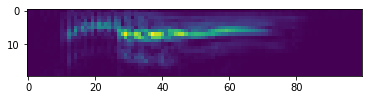

In [4]:
yf, yt, yZxx = signal.stft(y)
plt.imshow(np.abs(yZxx)[:20, 50:150], interpolation='none')
plt.show()

### Saw wave

In [5]:
f = 440
t = np.linspace(0, len(y)/sr, len(y))
saw = signal.sawtooth(2 * np.pi * f * t)
IPython.display.Audio(data=saw, rate=sr)

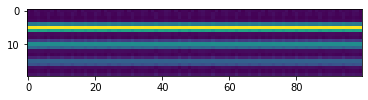

In [6]:
sawf, sawt, sawZxx = signal.stft(saw)
plt.imshow(np.abs(sawZxx)[:20, 50:150], interpolation='none')
plt.show()

### Output

In [7]:
outt, outx = signal.istft(yZxx * sawZxx)
IPython.display.Audio(data=outx, rate=sr)

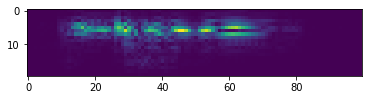

In [8]:
outf, outt, outZxx = signal.stft(outx)
plt.imshow(np.abs(outZxx)[:20, 50:150], interpolation='none')
plt.show()

### Naive Chunk Offline Vocoder

In [9]:
CHUNK = 512

In [10]:
out = np.array([])
for i in range(CHUNK, len(y), CHUNK):
    yf = fft.fft(y[i-CHUNK:i])
    sawf = fft.fft(saw[i-CHUNK:i])
    out = np.concatenate((out, fft.ifft(yf * sawf)))
IPython.display.Audio(data=out, rate=sr)

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/IPython/lib/display.py:157: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/scipy/signal/spectral.py:1812: UserWarning: Input data is complex, switching to return_onesided=False
  warnings.warn('Input data is complex, switching to '


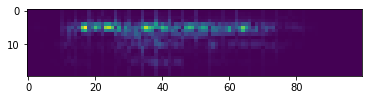

In [11]:
outf, outt, outZxx = signal.stft(out)
plt.imshow(np.abs(outZxx)[:20, 50:150], interpolation='none')
plt.show()

### Hann Overlap Chunk

In [12]:
hann = np.hanning(CHUNK)
out = np.zeros(len(y), dtype='complex128')
for i in range(CHUNK, len(y), CHUNK//2):
    yf = fft.fft(hann * y[i-CHUNK:i])
    sawf = fft.fft(hann * saw[i-CHUNK:i])
    out[i-CHUNK:i] += hann * fft.ifft(yf * sawf)
IPython.display.Audio(data=out, rate=sr)

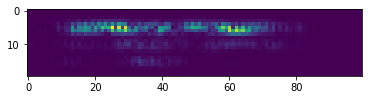

In [13]:
outf, outt, outZxx = signal.stft(out)
plt.imshow(np.abs(outZxx)[:20, 50:150], interpolation='none')
plt.show()

# Pitch-Detection Vocoder
https://ccrma.stanford.edu/~pdelac/154/m154paper.htm
https://www.scicoding.com/pitchdetection/

In [14]:
y, sr = librosa.load("samples/male_autotune.wav")

D3 D3 E3 F3 E3 D3 <br>
D3 D3 E3 F3 D3 A3 <br>
147 147 165 175 165 147 <br>
147 147 165 175 147 220

In [15]:
IPython.display.Audio(data=y, rate=sr)

### SciPy STFT Basic

In [16]:
f = 440
t = np.linspace(0, len(y)/sr, len(y))
saw = signal.sawtooth(2 * np.pi * f * t)

yf, yt, yZxx = signal.stft(y)
sawf, sawt, sawZxx = signal.stft(saw)
outt, outx = signal.istft(yZxx * sawZxx)
IPython.display.Audio(data=outx, rate=sr)

### Naive Chunk Basic

In [17]:
out = np.array([])
for i in range(CHUNK, len(y), CHUNK):
    yf = fft.fft(y[i-CHUNK:i])
    sawf = fft.fft(saw[i-CHUNK:i])
    out = np.concatenate((out, fft.ifft(yf * sawf)))
IPython.display.Audio(data=out, rate=sr)

### Hann Overlap Chunk Basic

In [18]:
hann = np.hanning(CHUNK)
out = np.zeros(len(y), dtype='complex128')
for i in range(CHUNK, len(y), CHUNK//2):
    yf = fft.fft(hann * y[i-CHUNK:i])
    sawf = fft.fft(hann * saw[i-CHUNK:i])
    out[i-CHUNK:i] += hann * fft.ifft(yf * sawf)
IPython.display.Audio(data=out, rate=sr)

## Autocorrelation

### No prominence

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,
/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]


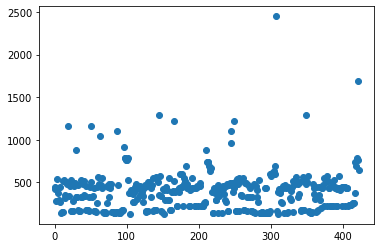

In [19]:
pitches = []
for i in range(CHUNK, len(y), CHUNK):
    auto = sm.tsa.acf(y[i-CHUNK:i], nlags=sr//20)
    peaks = signal.find_peaks(auto)[0]
    if len(peaks) > 0:
        lag = peaks[0]
        pitch = sr / lag
    else:
        pitch = None
    if pitch and pitch > 27 and pitch < 4187:
        pitches.append(pitch)
plt.plot(pitches, 'o')

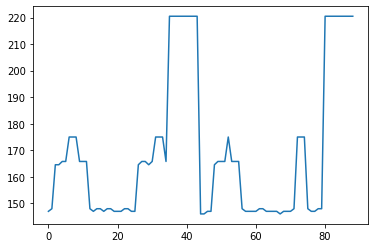

In [20]:
trim_pitches = []
for p in pitches:
    isD3 = p > 146 and p < 148
    isE3 = p > 164 and p < 166
    isF3 = p > 174 and p < 176
    isA3 = p > 219 and p < 221
    if isD3 or isE3 or isF3 or isA3:
        trim_pitches.append(p)
plt.plot(trim_pitches)
plt.show()

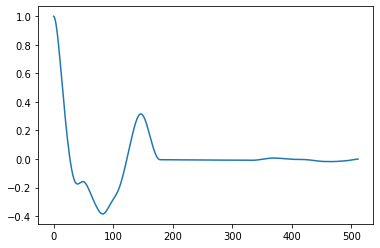

49
450.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


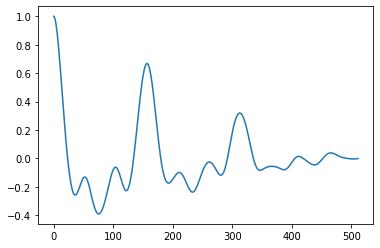

52
424.03846153846155


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


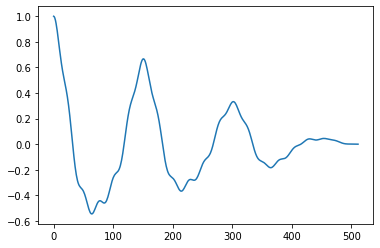

78
282.6923076923077


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


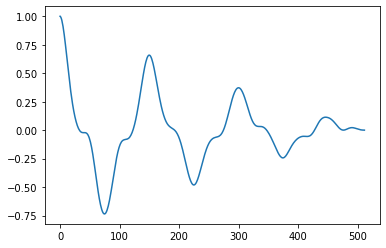

41
537.8048780487804


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


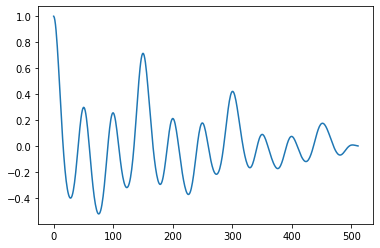

50
441.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


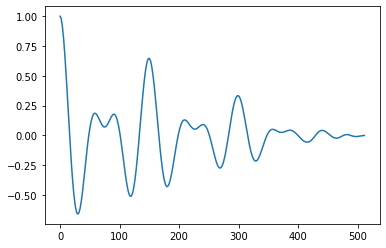

59
373.728813559322


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


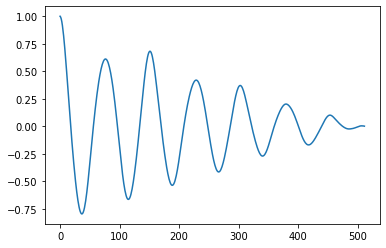

76
290.13157894736844


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


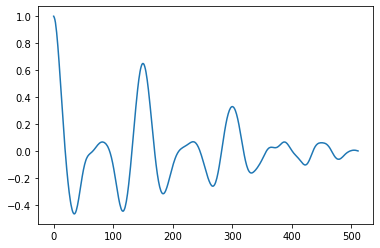

82
268.9024390243902


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


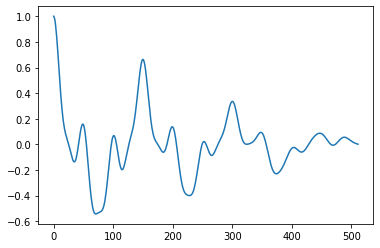

49
450.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


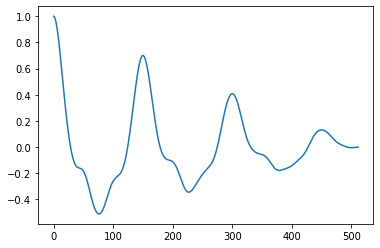

150
147.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


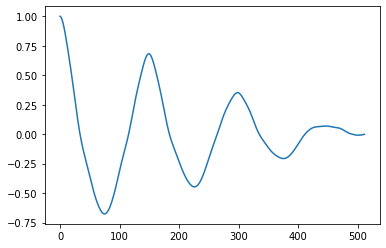

149
147.98657718120805


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


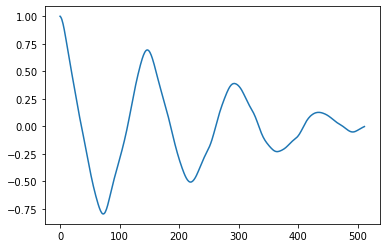

147
150.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


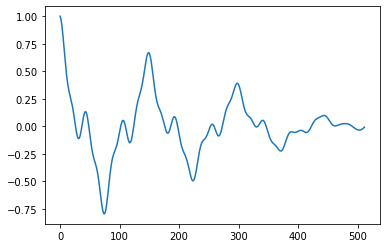

43
512.7906976744187


In [21]:
for i in range(CHUNK, CHUNK*50, CHUNK):
    auto = sm.tsa.acf(y[i-CHUNK:i], nlags=sr//20)
    peaks = signal.find_peaks(auto)[0]
    if len(peaks) > 0:
        plt.plot(auto)
        plt.show()
        lag = peaks[0]
        print(lag)
        pitch = sr / lag
        print(pitch)

### Prominence

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,
/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]


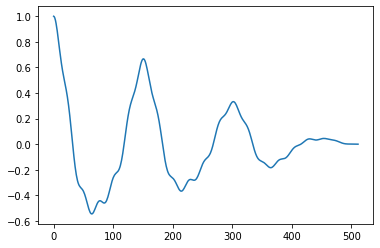

151
146.02649006622516


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


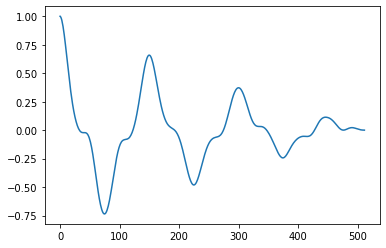

150
147.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


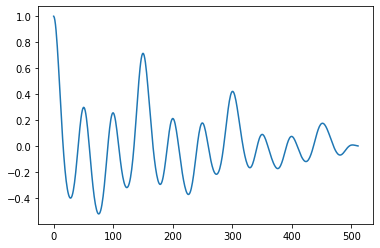

150
147.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


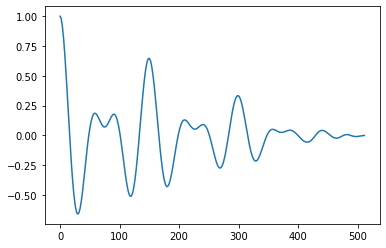

149
147.98657718120805


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


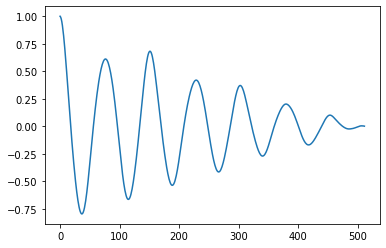

76
290.13157894736844


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


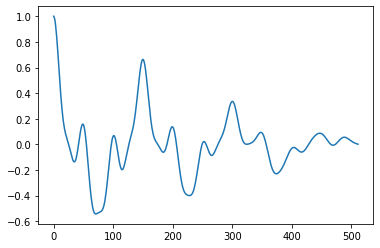

150
147.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


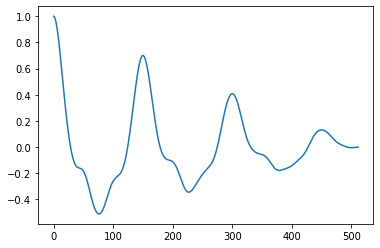

150
147.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


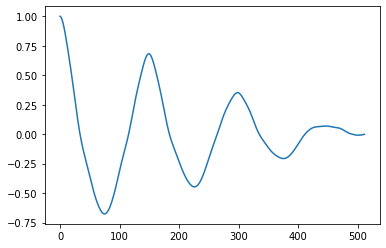

149
147.98657718120805


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


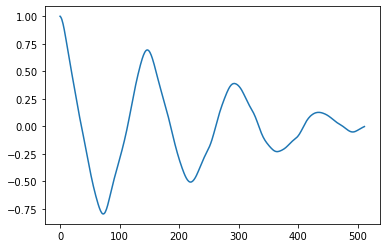

147
150.0


/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


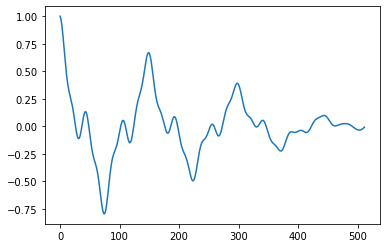

149
147.98657718120805


In [22]:
for i in range(CHUNK, CHUNK*50, CHUNK):
    auto = sm.tsa.acf(y[i-CHUNK:i], nlags=sr//20)
    peaks = signal.find_peaks(auto, prominence=1)[0]
    if len(peaks) > 0:
        plt.plot(auto)
        plt.show()
        lag = peaks[0]
        print(lag)
        pitch = sr / lag
        print(pitch)

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,
/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]


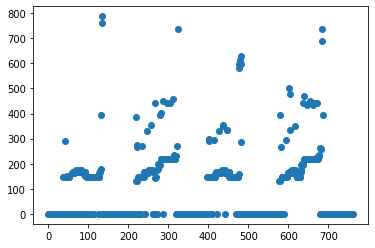

In [23]:
def acPitchTracking(y):
    pitches = []
    for i in range(CHUNK, len(y), CHUNK):
        auto = sm.tsa.acf(y[i-CHUNK:i], nlags=sr//20)
        peaks = signal.find_peaks(auto, prominence=1)[0]
        if len(peaks) > 0:
            lag = peaks[0]
            pitch = sr / lag
        else:
            pitch = 0
        if pitch >= librosa.note_to_hz('C2') and pitch < librosa.note_to_hz('C7'):
            pitches.append(pitch)
        else:
            pitches.append(0)
    return pitches
pitches = acPitchTracking(y)
plt.plot(pitches, 'o')

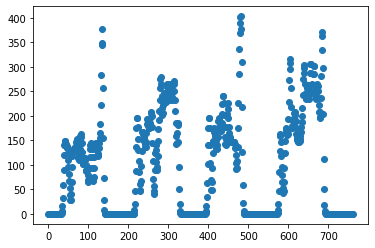

In [24]:
pitches_smooth = ndimage.gaussian_filter1d(np.array(pitches), 2.0)
plt.plot(pitches_smooth, 'o')

In [25]:
def bilateralFtr1D(y, sSpatial = 5, sIntensity = 1):
    '''
    version: 1.0
    author: akshay
    date: 10/03/2016
    
    The equation of the bilateral filter is
    
            (       dx ^ 2       )       (         dI ^2        )
    F = exp (- ----------------- ) * exp (- ------------------- )
            (  sigma_spatial ^ 2 )       (  sigma_Intensity ^ 2 )
        ~~~~~~~~~~~~~~~~~~~~~~~~~~
        This is a guassian filter!
        dx - The 'geometric' distance between the 'center pixel' and the pixel
         to sample
    dI - The difference between the intensity of the 'center pixel' and
         the pixel to sample
    sigma_spatial and sigma_Intesity are constants. Higher values mean
    that we 'tolerate more' higher value of the distances dx and dI.
    
    Dependencies: numpy, scipy.ndimage.gaussian_filter1d
    
    calc gaussian kernel size as: filterSize = (2 * radius) + 1; radius = floor (2 * sigma_spatial)
    y - input data
    '''

    # gaussian filter and parameters
    radius = int(np.floor (2 * sSpatial))
    filterSize = ((2 * radius) + 1)
    print(filterSize)
    ftrArray = np.zeros (filterSize)
    ftrArray[radius] = 1
    
    # Compute the Gaussian filter part of the Bilateral filter
    gauss = ndimage.gaussian_filter1d(ftrArray, sSpatial)

    # 1d data dimensions
    width = y.size

    # 1d resulting data
    ret = np.zeros (width)

    for i in range(width):

        ## To prevent accessing values outside of the array
        # The left part of the lookup area, clamped to the boundary
        xmin = max (i - radius, 1);
        # How many columns were outside the image, on the left?
        dxmin = xmin - (i - radius);

        # The right part of the lookup area, clamped to the boundary
        xmax = min (i + radius, width);
        # How many columns were outside the image, on the right?
        dxmax = (i + radius) - xmax;

        # The actual range of the array we will look at
        area = y [xmin:xmax]

        # The center position
        center = y [i]

        # The left expression in the bilateral filter equation
        # We take only the relevant parts of the matrix of the
        # Gaussian weights - we use dxmin, dxmax, dymin, dymax to
        # ignore the parts that are outside the image
        expS = gauss[(1+dxmin):(filterSize-dxmax)]

        # The right expression in the bilateral filter equation
        dy = y [xmin:xmax] - y [i]
        dIsquare = (dy * dy)
        expI = np.exp (- dIsquare / (sIntensity * sIntensity))

        # The bilater filter (weights matrix)
        F = expI * expS

        # Normalized bilateral filter
        Fnormalized = F / sum(F)

        # Multiply the area by the filter
        tempY = y [xmin:xmax] * Fnormalized

        # The resulting pixel is the sum of all the pixels in
        # the area, according to the weights of the filter
        # ret(i,j,R) = sum (tempR(:))
        ret[i] = sum (tempY)
    
    return ret

9


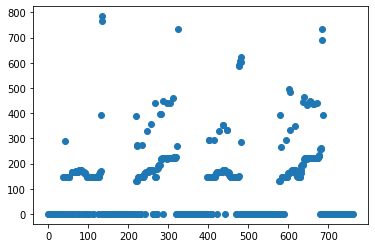

In [26]:
pitches_bilateral = bilateralFtr1D(np.array(pitches), 2, 20)
plt.plot(pitches_bilateral, 'o')

### Limit pitch to smaller range for filter testing

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,
/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]


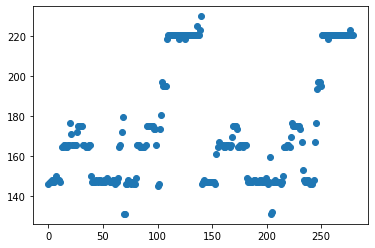

In [28]:
pitches = []
for i in range(CHUNK, len(y), CHUNK):
    auto = sm.tsa.acf(y[i-CHUNK:i], nlags=sr//20)
    peaks = signal.find_peaks(auto, prominence=1)[0]
    if len(peaks) > 0:
        lag = peaks[0]
        pitch = sr / lag
    else:
        pitch = 0
    if pitch > 20 and pitch < 230:
        pitches.append(pitch)
plt.plot(pitches, 'o')

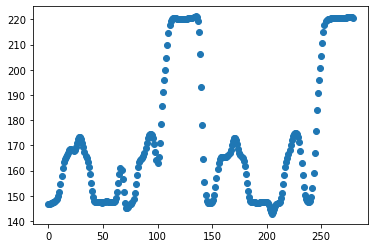

In [29]:
pitches_smooth = ndimage.gaussian_filter1d(np.array(pitches), 2.0)
plt.plot(pitches_smooth, 'o')

9


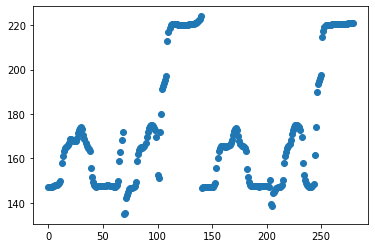

In [30]:
pitches_bilateral = bilateralFtr1D(np.array(pitches), 2, 20)
plt.plot(pitches_bilateral, 'o')

## Librosa Pitch Tracking

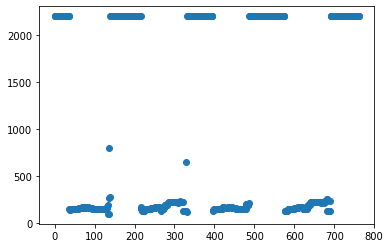

In [31]:
pitches = librosa.yin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'), sr=sr)
plt.plot(pitches, 'o')
plt.show()

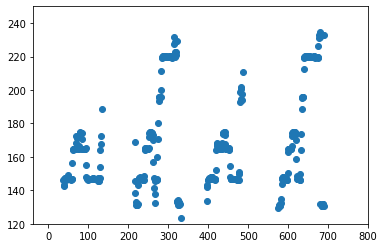

In [32]:
plt.plot(pitches, 'o')
plt.ylim((120,250))
plt.show()

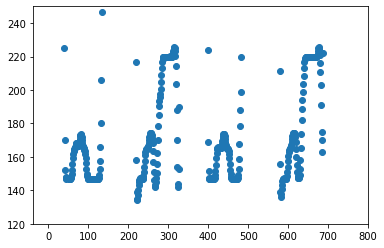

In [33]:
pitches_smooth = ndimage.gaussian_filter1d(np.array(pitches), 2.0)
plt.ylim((120,250))
plt.plot(pitches_smooth, 'o')

9


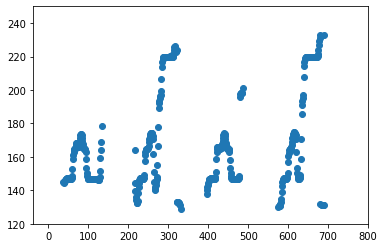

In [34]:
pitches_smooth = bilateralFtr1D(np.array(pitches), 2, 20)
plt.ylim((120,250))
plt.plot(pitches_smooth, 'o')

### Pitch quantization

In [35]:
notes = ["C", "D", "E", "F", "G", "A", "B"]
note_freqs = []
for i in range(2, 7):
    for n in notes:
        freq = librosa.note_to_hz(n + str(i))
        note_freqs.append(freq)
note_freqs

[65.40639132514966,
 73.41619197935188,
 82.4068892282175,
 87.30705785825097,
 97.99885899543733,
 110.0,
 123.47082531403103,
 130.8127826502993,
 146.8323839587038,
 164.81377845643496,
 174.61411571650194,
 195.99771799087463,
 220.0,
 246.94165062806206,
 261.6255653005986,
 293.6647679174076,
 329.6275569128699,
 349.2282314330039,
 391.99543598174927,
 440.0,
 493.8833012561241,
 523.2511306011972,
 587.3295358348151,
 659.2551138257398,
 698.4564628660078,
 783.9908719634985,
 880.0,
 987.7666025122483,
 1046.5022612023945,
 1174.6590716696303,
 1318.5102276514797,
 1396.9129257320155,
 1567.981743926997,
 1760.0,
 1975.533205024496]

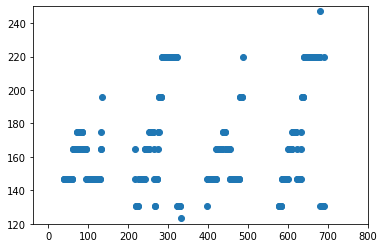

In [36]:
def quantizePitches(pitches):
    pq = [0]
    for pitch in pitches:
        nf = np.array(note_freqs)
        i = (np.abs(nf - pitch)).argmin()
        pq.append(nf[i])
    return pq
pitches_quantized = quantizePitches(pitches)
plt.ylim((120,250))
plt.plot(pitches_quantized, 'o')

## Mediocre Singing Comparison

In [37]:
y, sr = librosa.load("samples/mediocre_singing.wav")
IPython.display.Audio(data=y, rate=sr)

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


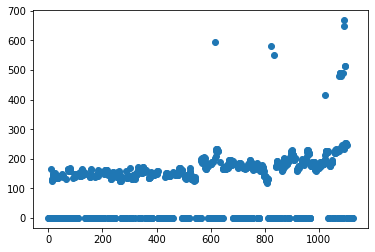

In [38]:
ac_pitches = acPitchTracking(y)
plt.plot(ac_pitches, 'o')

(100.0, 260.0)

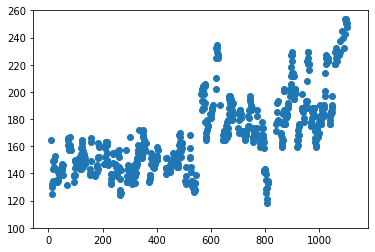

In [39]:
plt.plot(ac_pitches, 'o')
plt.ylim(100,  260)

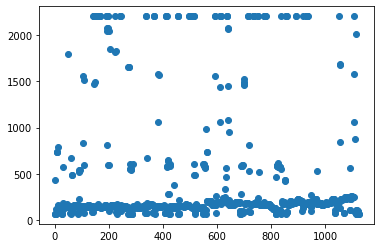

In [40]:
lib_pitches = librosa.yin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'), sr=sr)
plt.plot(lib_pitches, 'o')

(100.0, 260.0)

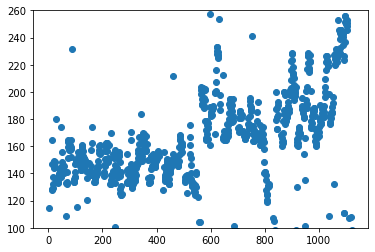

In [41]:
plt.plot(lib_pitches, 'o')
plt.ylim(100,  260)

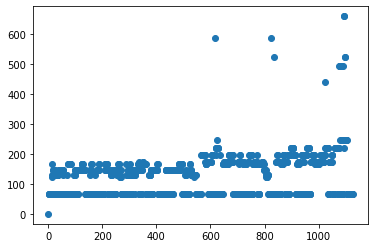

In [42]:
ac_pitches_q = quantizePitches(ac_pitches)
plt.plot(ac_pitches_q, 'o')

(100.0, 260.0)

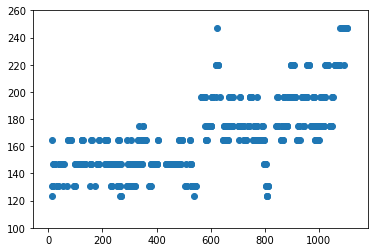

In [43]:
plt.plot(ac_pitches_q, 'o')
plt.ylim(100,  260)

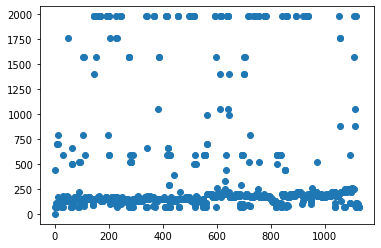

In [44]:
lib_pitches_q = quantizePitches(lib_pitches)
plt.plot(lib_pitches_q, 'o')

(100.0, 260.0)

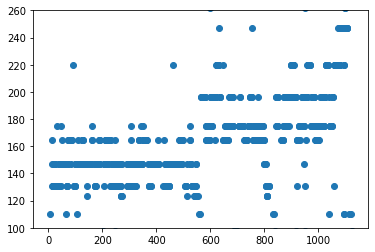

In [45]:
plt.plot(lib_pitches_q, 'o')
plt.ylim(100,  260)

 ## Hampel Outlier Imputation

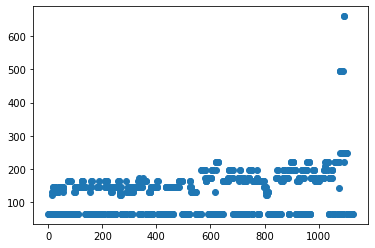

In [46]:
ac_pitches_qi = hampel(pd.Series(ac_pitches_q), window_size=5, n=3, imputation=True)
plt.plot(np.array(ac_pitches_qi), 'o')

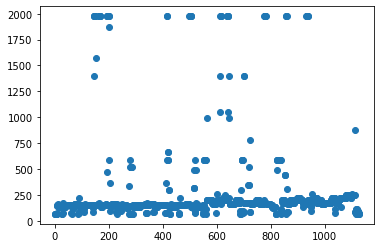

In [47]:
lib_pitches_qi = hampel(pd.Series(lib_pitches_q), window_size=5, n=3, imputation=True)
plt.plot(np.array(lib_pitches_qi), 'o')

In [48]:
ac_pitches_qie = []
for pitch in ac_pitches_qi:
    ac_pitches_qie += [pitch] * CHUNK
ac_pitches_qie = np.array(ac_pitches_qie[:len(y)])
print(len(y))
print(len(ac_pitches_qie))

576794
576794


In [49]:
t = np.linspace(0, len(y)//sr, len(y))
saw_p  = signal.sawtooth(2 * np.pi * ac_pitches_qie * t)
IPython.display.Audio(data=saw_p, rate=sr)

In [50]:
sin_p = np.sin(2 * np.pi * ac_pitches_qie * t)
IPython.display.Audio(data=sin_p, rate=sr)

In [51]:
yf, yt, yZxx = signal.stft(y)
sawf, sawt, sawZxx = signal.stft(saw_p)
outt, outx = signal.istft(yZxx * sawZxx)
IPython.display.Audio(data=outx, rate=sr)

/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:671: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,
/Users/kevinngo/Documents/soundblend/venv/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]


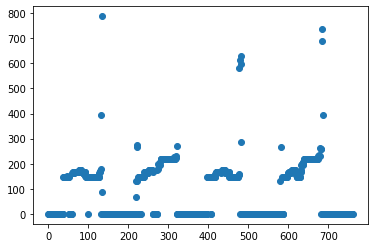

In [52]:
y, sr = librosa.load("samples/male_autotune.wav")
pitches = acPitchTracking(y)
pitches_quantized = quantizePitches(pitches)
pitches_hampel = hampel(pd.Series(pitches), window_size=5, n=3, imputation=True)
plt.plot(np.array(pitches_hampel), 'o')